# Huấn luyện YOLO - Biển báo giao thông Việt Nam

**Pipeline:** cài đặt → cấu hình → xử lý dataset → huấn luyện → đánh giá → xuất model.

---
**Môi trường khuyến nghị:** Kaggle Notebook · GPU T4 x1 hoặc T4 x2  
**Framework:** [Ultralytics YOLO11](https://github.com/ultralytics/ultralytics)  
**Dataset:** Vietnam Traffic Sign · 56 classes · Roboflow

---
<a id='1'></a>
## 1. Kiểm tra môi trường & GPU

In [1]:
!nvidia-smi

Tue Apr 28 09:51:29 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.105.08             Driver Version: 580.105.08     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   52C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import torch, sys, os

print(f"Python         : {sys.version.split()[0]}")
print(f"PyTorch        : {torch.__version__}")
print(f"CUDA available : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    for i in range(torch.cuda.device_count()):
        p = torch.cuda.get_device_properties(i)
        print(f"  GPU {i}: {p.name}  |  VRAM: {p.total_memory/1e9:.1f} GB")

!df -h /kaggle/working

Python         : 3.12.12
PyTorch        : 2.10.0+cu128
CUDA available : True
  GPU 0: Tesla T4  |  VRAM: 15.6 GB
  GPU 1: Tesla T4  |  VRAM: 15.6 GB
Filesystem      Size  Used Avail Use% Mounted on
/dev/loop1       20G  369M   20G   2% /kaggle/working


---
<a id='2'></a>
## 2. Cài đặt thư viện

In [3]:
!pip install ultralytics -q
!pip install nvidia-tensorrt

from ultralytics import YOLO, checks
checks()

Ultralytics 8.4.42 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6849.6/8062.4 GB disk)


---
<a id='3'></a>
## 3. Cấu hình tham số huấn luyện


In [ ]:
# ================================================================
# ⚙️  THAY ĐỔI CÁC THAM SỐ Ở ĐÂY
# ================================================================

# Đường dẫn tới data.yaml (sau khi Add dataset vào notebook)
DIR = '/kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam'
DATA_YAML = f'{DIR}/data.yaml'

# Kích cỡ model: n=nhanh nhất | s=cân bằng | m=tốt | l=rất tốt | x=tốt nhất
MODEL_SIZE = 'n'

EPOCHS   = 30
IMGSZ    = 640
BATCH    = 64      # Giảm xuống 8 nếu bị OOM
PATIENCE = 10      # Early stopping
WORKERS  = 8

# 0 = GPU đầu tiên | [0,1] = 2 GPU (T4x2) | 'cpu'
DEVICE = [0, 1]

# PROJECT  = '/kaggle/working/runs'
EXP_NAME = 'vietnam_traffic_sign'
# ================================================================

import os
MODEL_NAME   = f'yolo11{MODEL_SIZE}.pt'
VI_YAML      = '/kaggle/working/data_vi.yaml'
# Lấy thư mục gốc của dataset (nơi chứa data.yaml gốc)
dataset_root = os.path.dirname(DATA_YAML)  # /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam

# BEST_WEIGHTS = f"{PROJECT}/{EXP_NAME}/weights/best.pt"
# LAST_WEIGHTS = f"{PROJECT}/{EXP_NAME}/weights/last.pt"
# RESULT_DIR   = f"{PROJECT}/{EXP_NAME}"

# print('=' * 48)
# print(f"  Model    : {MODEL_NAME}")
# print(f"  Epochs   : {EPOCHS}  |  Patience : {PATIENCE}")
# print(f"  Img size : {IMGSZ}   |  Batch    : {BATCH}")
# print(f"  Device   : {DEVICE}")
# print(f"  Output   : {RESULT_DIR}")
# print('=' * 48)


---
<a id='4'></a>
## 4. Bảng ánh xạ: mã biển → tên tiếng Việt

In [5]:
import yaml
import os

# Ánh xạ mã -> tên tiếng Việt
CLASS_NAME_MAP = {
    'DP-135': 'Het tat ca cac lenh cam',
    'P-102': 'Cam di nguoc chieu',
    'P-103a': 'Cam o to',
    'P-103b': 'Cam o to re phai',
    'P-103c': 'Cam o to re trai',
    'P-104': 'Cam mo to',
    'P-106a': 'Cam xe tai',
    'P-106b': 'Cam xe tai (gioi han tai trong)',
    'P-107a': 'Cam xe o to khach',
    'P-112': 'Cam nguoi di bo',
    'P-115': 'Han che trong luong xe',
    'P-117': 'Han che chieu cao xe',
    'P-123a': 'Cam re trai',
    'P-123b': 'Cam re phai',
    'P-124a': 'Cam quay dau xe',
    'P-124b': 'Cam o to quay dau xe',
    'P-124c': 'Cam re trai va quay dau xe',
    'P-127': 'Toc do toi da cho phep',
    'P-128': 'Cam su dung coi',
    'P-130': 'Cam dung xe va do xe',
    'P-131a': 'Cam do xe',
    'P-137': 'Cam re trai va re phai',
    'P-245a': 'Cam xe dap dien va xe may dien',
    'R-301c': 'Huong di phai theo (di thang va re phai)',
    'R-301d': 'Huong di phai theo (re trai)',
    'R-301e': 'Huong di phai theo (re phai)',
    'R-302a': 'Huong phai di vong chuong ngai vat (phia phai)',
    'R-302b': 'Huong phai di vong chuong ngai vat (phia trai)',
    'R-303': 'Noi giao nhau chay theo vong xuyen',
    'R-407a': 'Duong mot chieu',
    'R-409': 'Cho quay xe',
    'R-425': 'Bat dau duong cao toc',
    'R-434': 'Lan duong danh rieng cho xe buyt',
    'S-509a': 'Thuyet minh bien chinh - Cam dung va do xe',
    'W-201a': 'Cho ngoat nguy hiem (vong trai)',
    'W-201b': 'Cho ngoat nguy hiem (vong phai)',
    'W-202a': 'Nhieu cho ngoat nguy hiem lien tiep (vong trai)',
    'W-202b': 'Nhieu cho ngoat nguy hiem lien tiep (vong phai)',
    'W-203b': 'Duong bi thu hep (hep ben trai)',
    'W-203c': 'Duong bi thu hep (hep ben phai)',
    'W-205a': 'Duong giao nhau (nga tu)',
    'W-205b': 'Duong giao nhau (nga ba phai)',
    'W-205d': 'Duong giao nhau (nga ba trai)',
    'W-207a': 'Giao nhau voi duong khong uu tien (hai phia)',
    'W-207b': 'Giao nhau voi duong khong uu tien (ben phai)',
    'W-207c': 'Giao nhau voi duong khong uu tien (ben trai)',
    'W-208': 'Giao nhau voi duong uu tien',
    'W-209': 'Giao nhau co tin hieu den',
    'W-210': 'Giao nhau voi duong sat co rao chan',
    'W-219': 'Doc xuong nguy hiem',
    'W-224': 'Nguoi di bo cat ngang',
    'W-225': 'Tre em',
    'W-227': 'Cong truong',
    'W-233': 'Nguy hiem khac',
    'W-235': 'Duong doi',
    'W-245a': 'Chuong ngai vat tren duong',
}

# Đường dẫn file data.yaml gốc (read-only)
DIR = '/kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam'
DATA_YAML = f'{DIR}/data.yaml'
# Đọc file gốc
with open(DATA_YAML, 'r', encoding='utf-8') as f:
    data = yaml.safe_load(f)

# Chuyển tên lớp sang tiếng Việt
old_names = data['names']
data['names'] = [CLASS_NAME_MAP[name] for name in old_names]

# --- Sửa đường dẫn train/val/test thành đường dẫn tuyệt đối trong Kaggle ---

# Các thư mục ảnh thực tế (giả sử cấu trúc: dataset_root/train/images, ...)
data['train'] = os.path.join(dataset_root, 'train/images')
data['val']   = os.path.join(dataset_root, 'valid/images')
data['test']  = os.path.join(dataset_root, 'test/images')

# Kiểm tra các thư mục có tồn tại không (tùy chọn)
for split in ['train', 'val', 'test']:
    path = data[split]
    if os.path.exists(path):
        print(f"✓ {split}: {path}")
    else:
        print(f"✗ {split}: {path} (không tồn tại, hãy kiểm tra lại)")

# Ghi file mới vào /kaggle/working/
output_yaml = '/kaggle/working/data_vi.yaml'
with open(output_yaml, 'w', encoding='utf-8') as f:
    yaml.dump(data, f, allow_unicode=True, sort_keys=False, default_flow_style=False)

print(f"\nĐã lưu file mới tại: {output_yaml}")

✓ train: /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/train/images
✓ val: /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/valid/images
✓ test: /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images

Đã lưu file mới tại: /kaggle/working/data_vi.yaml


---
<a id='5'></a>
## 5. Khám phá dataset

In [5]:
import glob
print(f"Dataset root: {dataset_root}\n")

for split in ['train', 'valid', 'test']:
    imgs = glob.glob(f"{dataset_root}/{split}/images/*.*")
    lbls = glob.glob(f"{dataset_root}/{split}/labels/*.*")
    print(f"  {split:6s}: {len(imgs):>5} ảnh  |  {len(lbls):>5} nhãn")

Dataset root: /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam

  train :  6750 ảnh  |   6750 nhãn
  valid :  1922 ảnh  |   1922 nhãn
  test  :   963 ảnh  |    963 nhãn


In [7]:
import glob
import os
from collections import defaultdict

# ── Cấu hình ──────────────────────────────────────────────────────────────────
# dataset_root = "path/to/your/dataset"  # <-- đổi đường dẫn tại đây

# Tên class (đọc từ data.yaml hoặc định nghĩa thủ công)
yaml_path = os.path.join("/kaggle/working/data_vi.yaml")
if os.path.exists(yaml_path):
    import yaml
    with open(yaml_path, "r", encoding="utf-8") as f:
        data = yaml.safe_load(f)
    class_names = data.get("names", [])
else:
    class_names = []   # để trống nếu không có yaml

# ── Hàm đếm annotation từ file label YOLO ─────────────────────────────────────
def count_annotations(label_files):
    total = 0
    class_count = defaultdict(int)
    for lf in label_files:
        with open(lf, "r") as f:
            for line in f:
                line = line.strip()
                if line:
                    cls_id = int(line.split()[0])
                    class_count[cls_id] += 1
                    total += 1
    return total, class_count

# ── Thống kê từng split ────────────────────────────────────────────────────────
print(f"{'='*60}")
print(f"  Dataset root: {dataset_root}")
print(f"{'='*60}\n")

grand_total_imgs  = 0
grand_total_annos = 0
grand_class_count = defaultdict(int)

for split in ['train', 'valid', 'test']:
    split_path = os.path.join(dataset_root, split)
    if not os.path.exists(split_path):
        print(f"  [{split:6s}]  ⚠️  Không tìm thấy thư mục '{split_path}'")
        continue

    imgs = glob.glob(f"{split_path}/images/*.*")
    lbls = glob.glob(f"{split_path}/labels/*.txt")

    total_anno, class_count = count_annotations(lbls)

    grand_total_imgs  += len(imgs)
    grand_total_annos += total_anno
    for k, v in class_count.items():
        grand_class_count[k] += v

    print(f"  [{split.upper():6s}]")
    print(f"    📁 Ảnh        : {len(imgs):>6}")
    print(f"    🏷️  Nhãn (file): {len(lbls):>6}")
    print(f"    🔖 Annotation : {total_anno:>6}")

    if class_count:
        print(f"    📊 Phân bố class:")
        for cls_id, cnt in sorted(class_count.items()):
            name = class_names[cls_id] if cls_id < len(class_names) else f"class_{cls_id}"
            bar  = "█" * (cnt * 30 // max(class_count.values()))
            print(f"       {name:>20s} (id={cls_id}): {cnt:>6}  {bar}")
    print()

# ── Tổng kết ──────────────────────────────────────────────────────────────────
print(f"{'='*60}")
print(f"  TỔNG CỘNG")
print(f"    📁 Tổng ảnh       : {grand_total_imgs:>6}")
print(f"    🔖 Tổng annotation: {grand_total_annos:>6}")
if grand_class_count:
    print(f"    📊 Tổng theo class:")
    for cls_id, cnt in sorted(grand_class_count.items()):
        name = class_names[cls_id] if cls_id < len(class_names) else f"class_{cls_id}"
        pct  = cnt / grand_total_annos * 100 if grand_total_annos else 0
        print(f"       {name:>20s} (id={cls_id}): {cnt:>6}  ({pct:.1f}%)")
print(f"{'='*60}")

  Dataset root: /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam

  [TRAIN ]
    📁 Ảnh        :   6750
    🏷️  Nhãn (file):   6750
    🔖 Annotation :  12923
    📊 Phân bố class:
       Het tat ca cac lenh cam (id=0):     42  
         Cam di nguoc chieu (id=1):    593  ██████
                   Cam o to (id=2):    118  █
           Cam o to re phai (id=3):     32  
           Cam o to re trai (id=4):    178  █
                  Cam mo to (id=5):     81  
                 Cam xe tai (id=6):    194  ██
       Cam xe tai (gioi han tai trong) (id=7):    268  ██
          Cam xe o to khach (id=8):     52  
            Cam nguoi di bo (id=9):     42  
       Han che trong luong xe (id=10):     42  
       Han che chieu cao xe (id=11):    346  ███
                Cam re trai (id=12):     28  
                Cam re phai (id=13):    211  ██
            Cam quay dau xe (id=14):    151  █
       Cam o to quay dau xe (id=15):     20  
       Cam re trai va quay dau xe (id=16):   

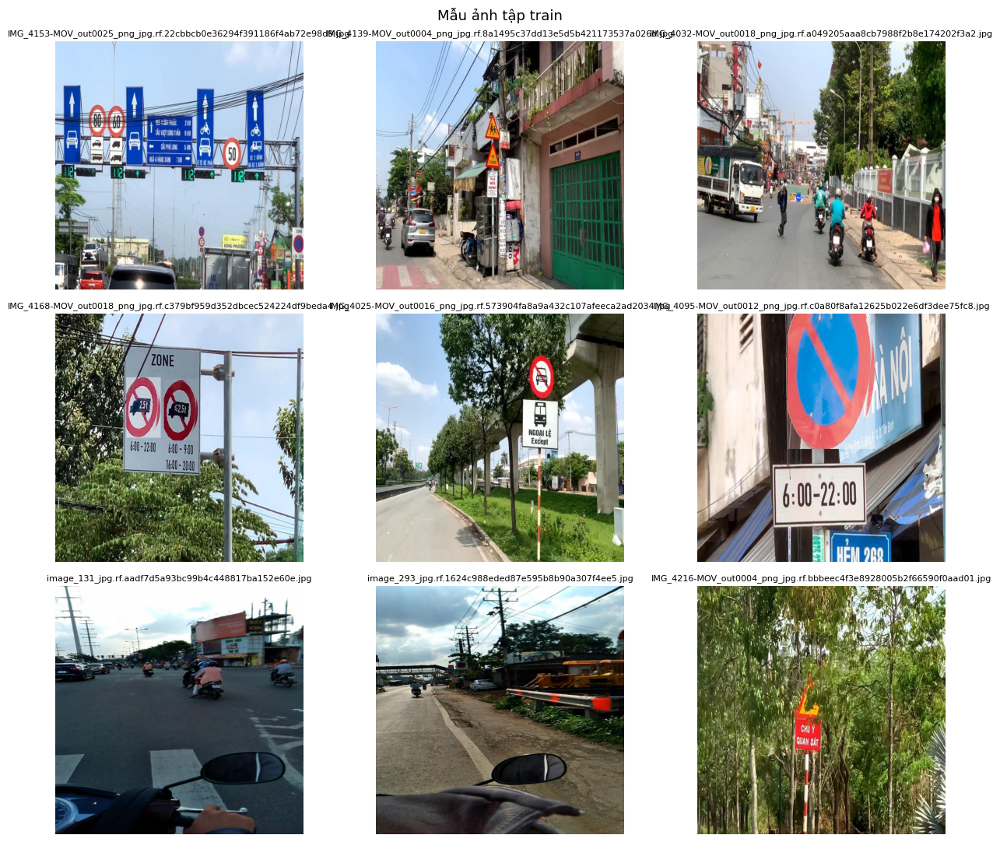

In [8]:
# Xem mẫu ảnh train
import random
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

train_imgs = glob.glob(f"{dataset_root}/train/images/*.*")
samples    = random.sample(train_imgs, min(9, len(train_imgs)))

fig, axes = plt.subplots(3, 3, figsize=(13, 11))
for ax, p in zip(axes.flat, samples):
    ax.imshow(mpimg.imread(p))
    ax.set_title(os.path.basename(p), fontsize=8)
    ax.axis('off')
plt.suptitle('Mẫu ảnh tập train', fontsize=13)
plt.tight_layout()
plt.show()

---
<a id='6'></a>
## 6. Huấn luyện mô hình

In [10]:
from ultralytics import YOLO

model = YOLO(MODEL_NAME)
print(f"✅ Đã tải model: {MODEL_NAME}")
model.info()

✅ Đã tải model: yolov8n.pt
YOLOv8n summary: 129 layers, 3,157,200 parameters, 0 gradients, 8.9 GFLOPs


(129, 3157200, 0, 8.8575488)

In [13]:
results = model.train(
    data        = VI_YAML,
    epochs      = EPOCHS,
    imgsz       = IMGSZ,
    batch       = BATCH,
    device      = DEVICE,
    workers     = WORKERS,
    # project     = PROJECT,
    name        = EXP_NAME,
    exist_ok    = True,
    patience    = PATIENCE,
    save        = True,
    save_period = 10,
    plots       = True,
    val         = True,
    hsv_h       = 0.015,
    hsv_s       = 0.7,
    hsv_v       = 0.4,
    degrees     = 5.0,
    translate   = 0.1,
    scale       = 0.5,
    fliplr      = 0.5,
    flipud      = 0.0,
    mosaic      = 1.0,
)

print('\n✅ Huấn luyện hoàn tất!')
# print(f"   Best weights : {BEST_WEIGHTS}")

Ultralytics 8.4.42 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
                                                       CUDA:1 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=64, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_vi.yaml, degrees=5.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=vietnam_traffic_sign-y

---
<a id='7'></a>
## 7. Theo dõi quá trình huấn luyện

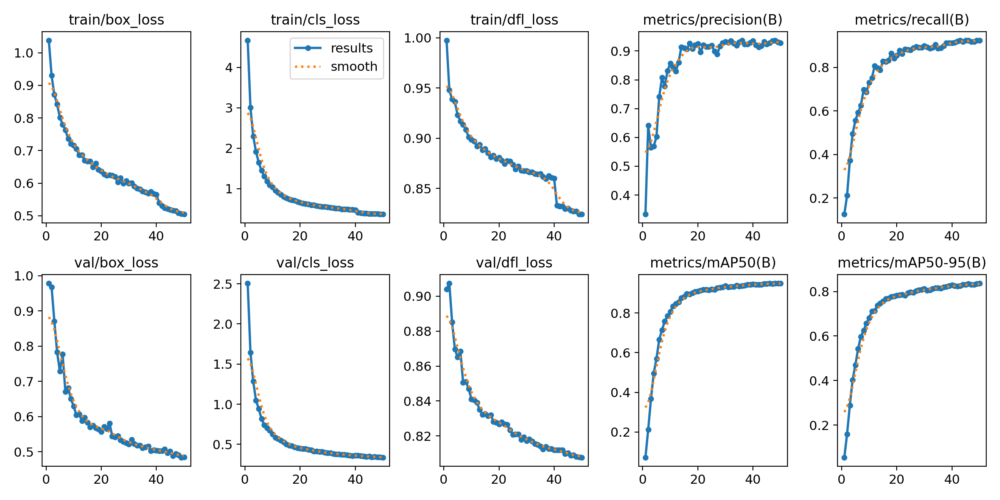

In [11]:
from IPython.display import Image as IPImage, display

RESULT_DIR = '/kaggle/working/runs/detect/vietnam_traffic_sign'
results_png = os.path.join(RESULT_DIR, 'results.png')
if os.path.exists(results_png):
    display(IPImage(filename=results_png, width=1000))
else:
    print('⚠️  Chưa có results.png')

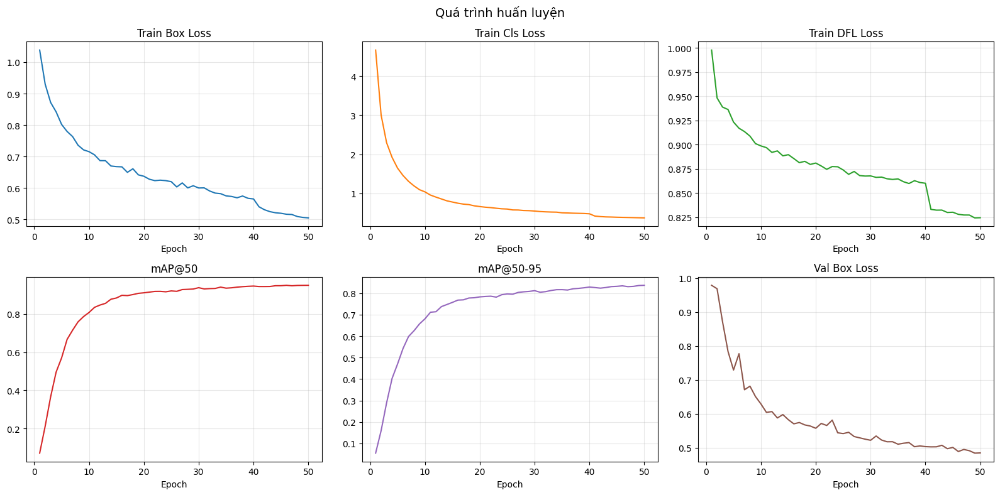

In [12]:
# Vẽ lại đường cong loss & metrics từ CSV
import pandas as pd

csv_path = os.path.join(RESULT_DIR, 'results.csv')
if os.path.exists(csv_path):
    df = pd.read_csv(csv_path)
    df.columns = df.columns.str.strip()

    plot_cols = [
        ('train/box_loss',      'Train Box Loss',  'tab:blue'),
        ('train/cls_loss',      'Train Cls Loss',  'tab:orange'),
        ('train/dfl_loss',      'Train DFL Loss',  'tab:green'),
        ('metrics/mAP50(B)',    'mAP@50',          'tab:red'),
        ('metrics/mAP50-95(B)', 'mAP@50-95',       'tab:purple'),
        ('val/box_loss',        'Val Box Loss',    'tab:brown'),
    ]
    fig, axes = plt.subplots(2, 3, figsize=(16, 8))
    fig.suptitle('Quá trình huấn luyện', fontsize=14)
    for ax, (col, title, color) in zip(axes.flat, plot_cols):
        if col in df.columns:
            ax.plot(df['epoch'], df[col], color=color)
            ax.set_title(title)
            ax.set_xlabel('Epoch')
            ax.grid(True, alpha=0.3)
        else:
            ax.set_visible(False)
    plt.tight_layout()
    plt.savefig('/kaggle/working/training_curves.png', dpi=120)
    plt.show()
else:
    print('⚠️  Chưa có results.csv')

--- confusion_matrix_normalized.png ---


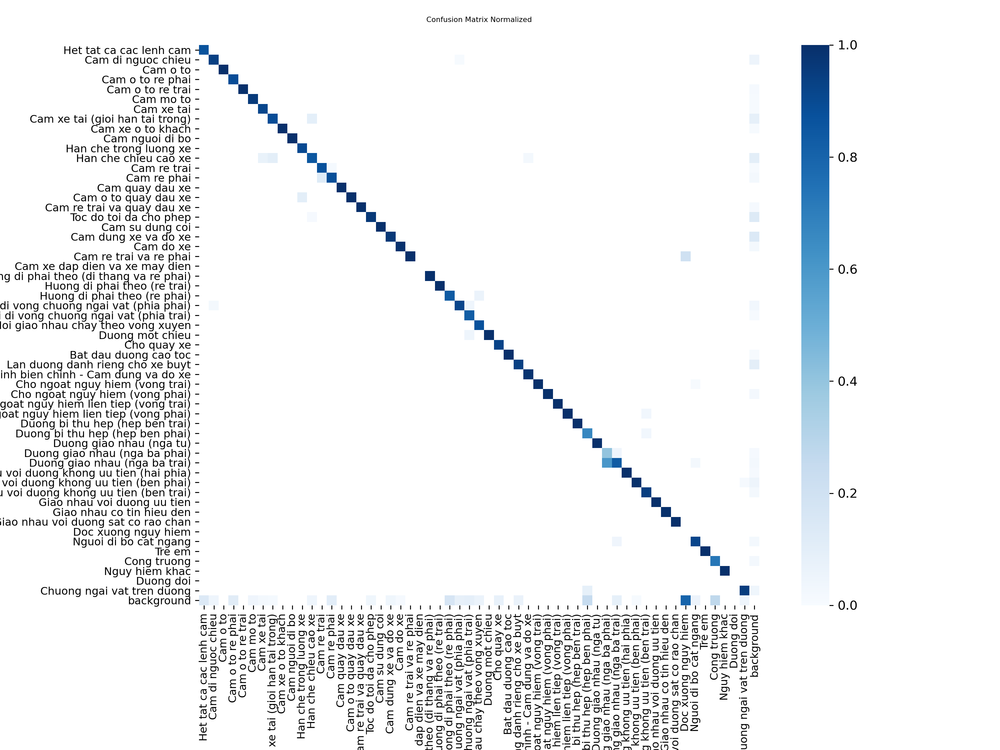

In [13]:
# Confusion matrix
for cm in ['confusion_matrix_normalized.png', 'confusion_matrix.png']:
    p = os.path.join(RESULT_DIR, cm)
    if os.path.exists(p):
        print(f'--- {cm} ---')
        display(IPImage(filename=p, width=900))
        break

---
<a id='8'></a>
## 8. Đánh giá trên tập test

In [15]:
model_eval = YOLO('/kaggle/working/runs/detect/vietnam_traffic_sign/weights/best.pt')
metrics    = model_eval.val(data=VI_YAML, split='test', device=DEVICE)

print('\n' + '='*48)
print('  📊 KẾT QUẢ TRÊN TẬP TEST')
print('='*48)
print(f"  mAP@50      : {metrics.box.map50:.4f}")
print(f"  mAP@50-95   : {metrics.box.map:.4f}")
print(f"  Precision   : {metrics.box.mp:.4f}")
print(f"  Recall      : {metrics.box.mr:.4f}")
print('='*48)

Ultralytics 8.4.41 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,593,072 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image access ✅ (ping: 1.7±1.0 ms, read: 11.1±5.6 MB/s, size: 67.6 KB)
val: Scanning /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/labels... 963 images, 52 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 963/963 175.9it/s 5.5s0.0s
WARNING ⚠️ val: Cache directory /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 61/61 6.4it/s 9.5s0.1s
                   all        963       1836      0.915      0.956      0.974      0.854
Het tat ca cac lenh cam          8          8      0.945          1      0.995      0.905
    Cam di nguoc chieu         81         86      0.973      0.829      0.892      0.648
              Cam o to         17      

---
<a id='9'></a>
## 9. Inference & hiển thị kết quả


image 1/1 /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images/IMG_4168-MOV_out0001_png_jpg.rf.bc7e61c4ed82f569333bc32f0d6497b9.jpg: 640x640 2 Cam xe tai (gioi han tai trong)s, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


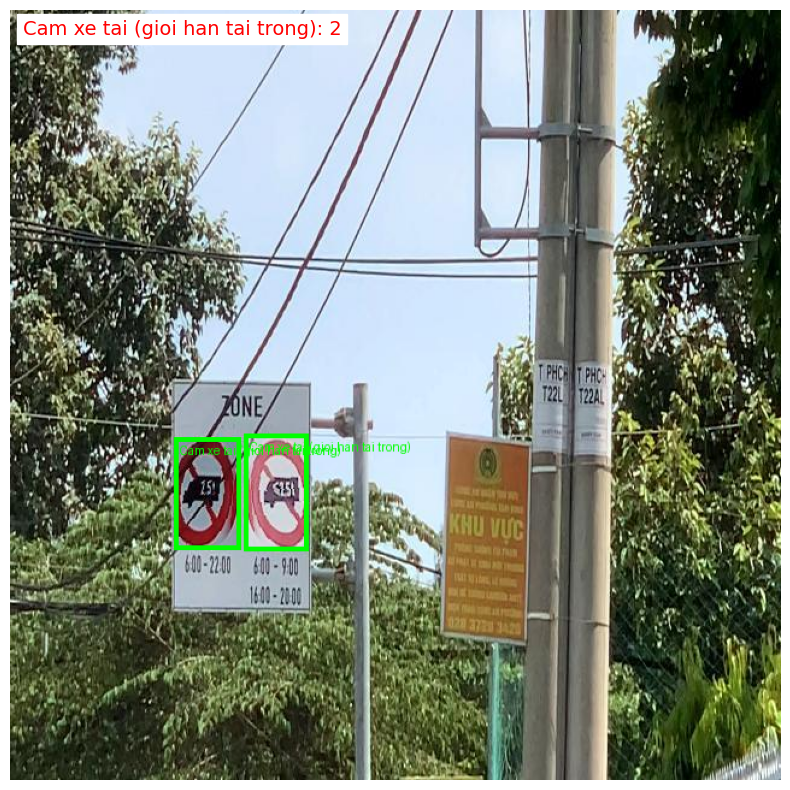


image 1/1 /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images/IMG_4089-MOV_out0022_png_jpg.rf.250108803518fcdb95ce094182cd30e0.jpg: 640x640 1 Cam quay dau xe, 8.3ms
Speed: 1.5ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


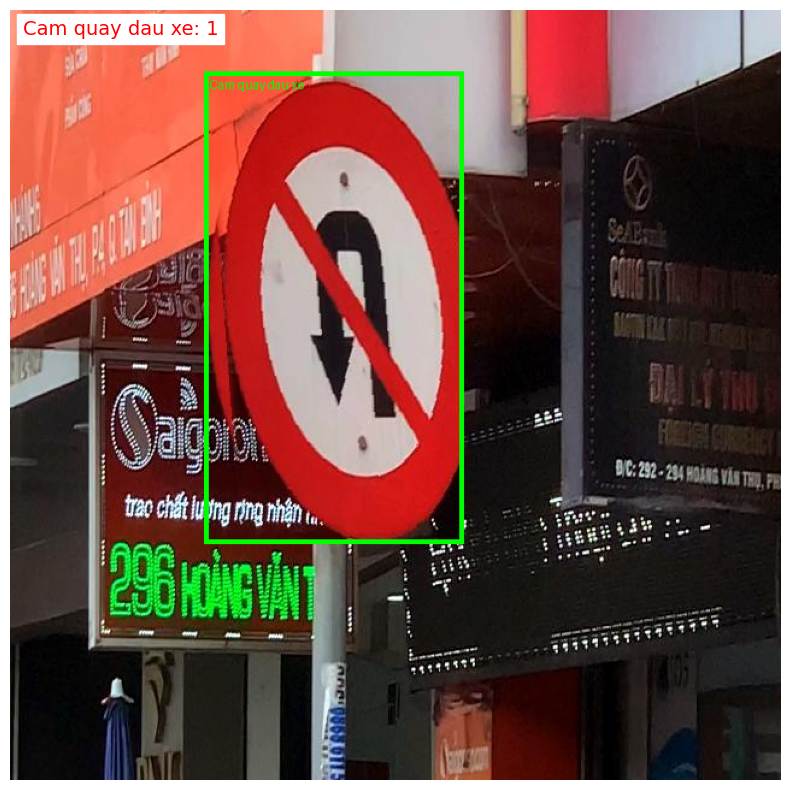


image 1/1 /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images/IMG_4182-MOV_out0003_png_jpg.rf.aaec4b31a926bffd444a37059bf7eb92.jpg: 640x640 1 Cam di nguoc chieu, 1 Huong phai di vong chuong ngai vat (phia phai), 8.5ms
Speed: 1.6ms preprocess, 8.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


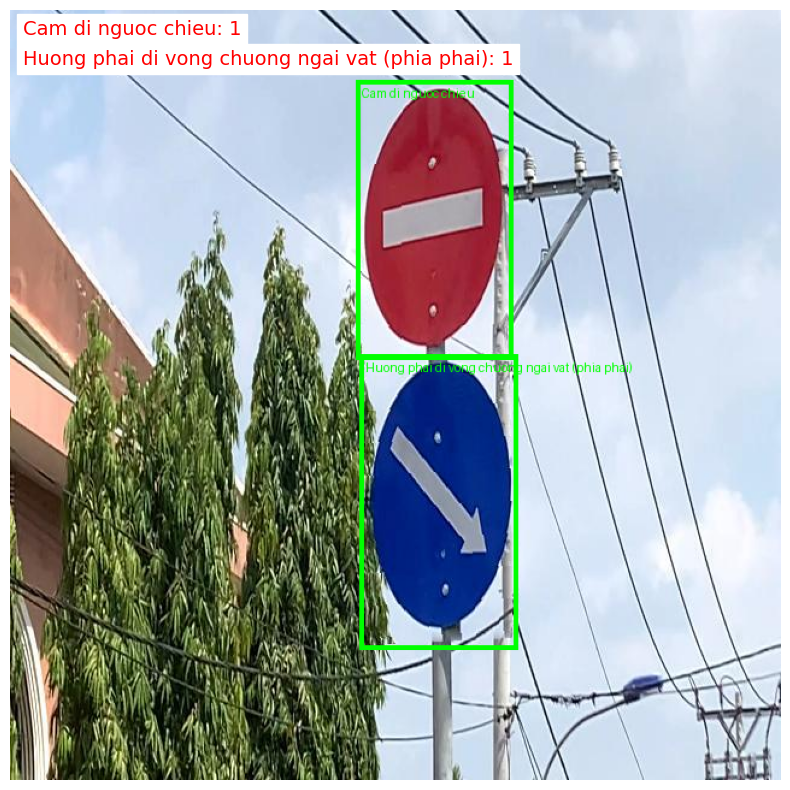


image 1/1 /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images/IMG_4101-MOV_out0009_png_jpg.rf.2e47b8651b46fc3e4f167df5ef03f8c3.jpg: 640x640 1 Cam o to re phai, 9.2ms
Speed: 1.7ms preprocess, 9.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


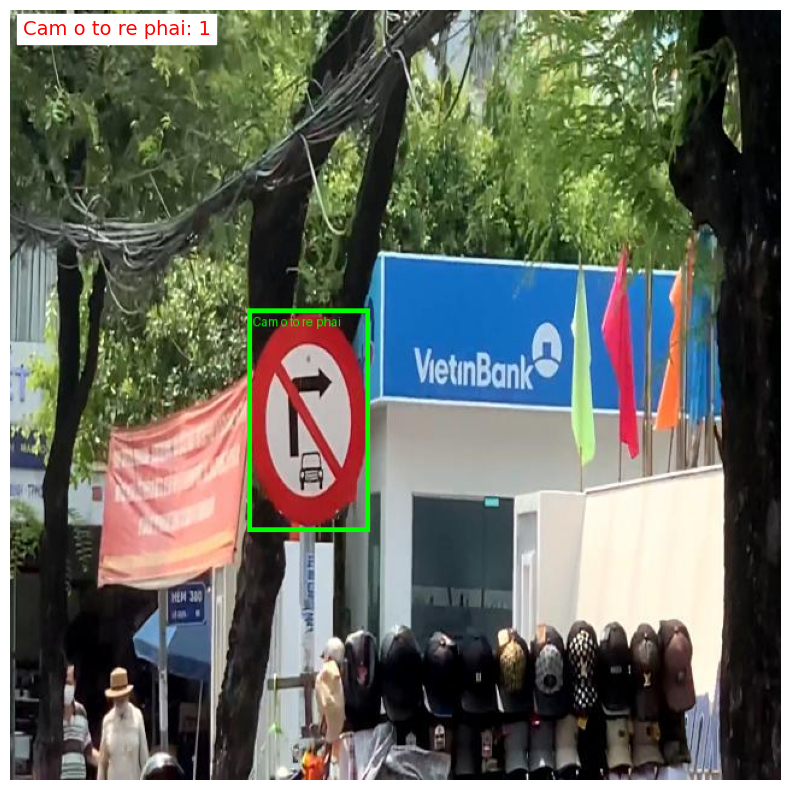


image 1/1 /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images/image_345_jpg.rf.58a55a8487f0a33b961b750e339ebae0.jpg: 640x640 1 Cam dung xe va do xe, 8.4ms
Speed: 1.6ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


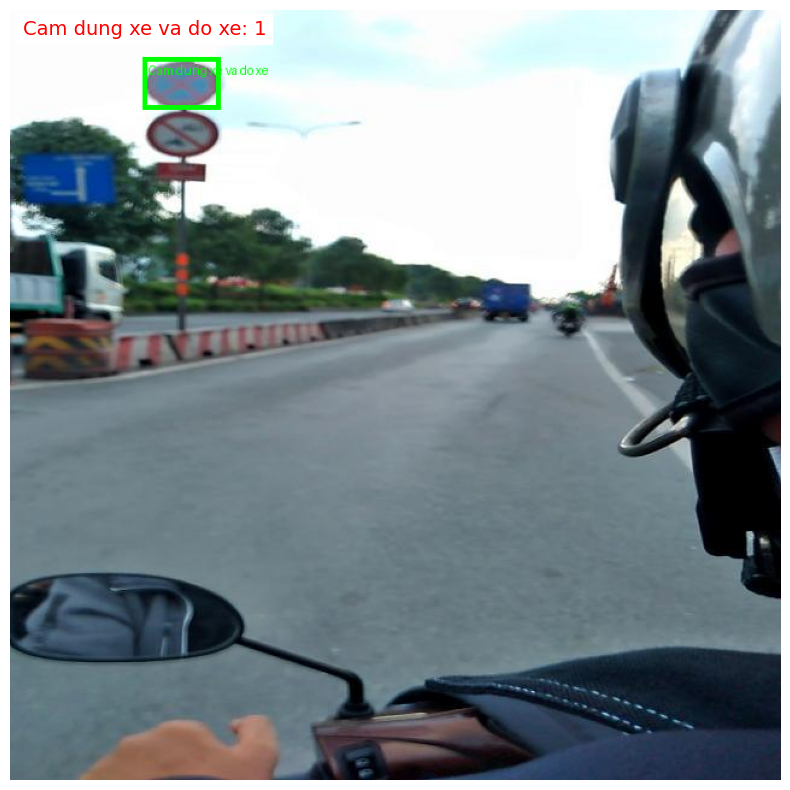


image 1/1 /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images/IMG_4147-MOV_out0028_png_jpg.rf.70da42542ab2ad521ff98474424327e5.jpg: 640x640 1 Chuong ngai vat tren duong, 8.3ms
Speed: 1.6ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


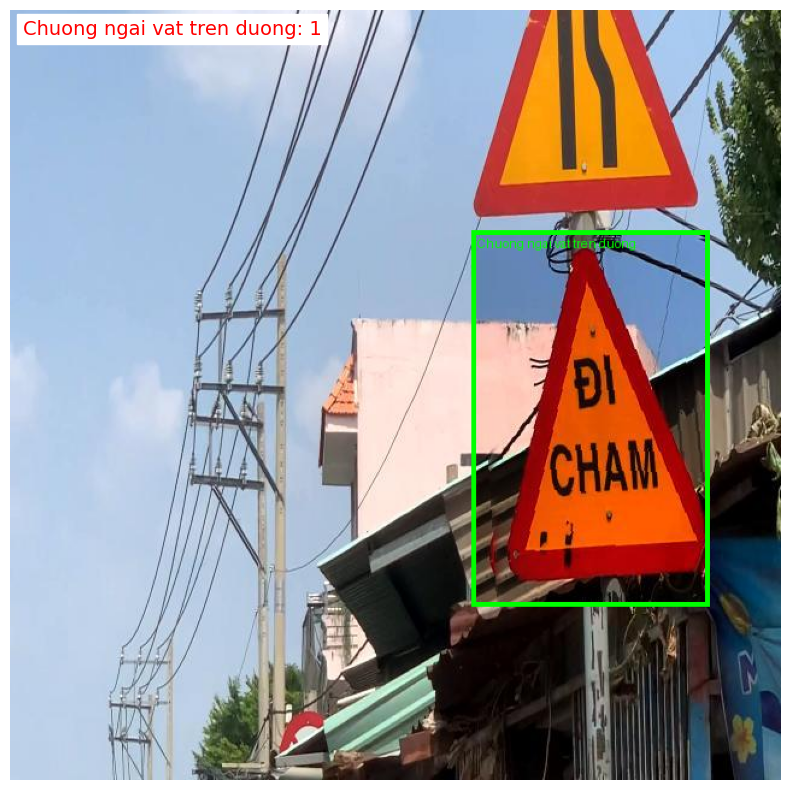


image 1/1 /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images/IMG_4120-MOV_out0061_png_jpg.rf.d19da8d3428b3f622f8a7d7c5964281a.jpg: 640x640 1 Cam do xe, 8.6ms
Speed: 1.7ms preprocess, 8.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


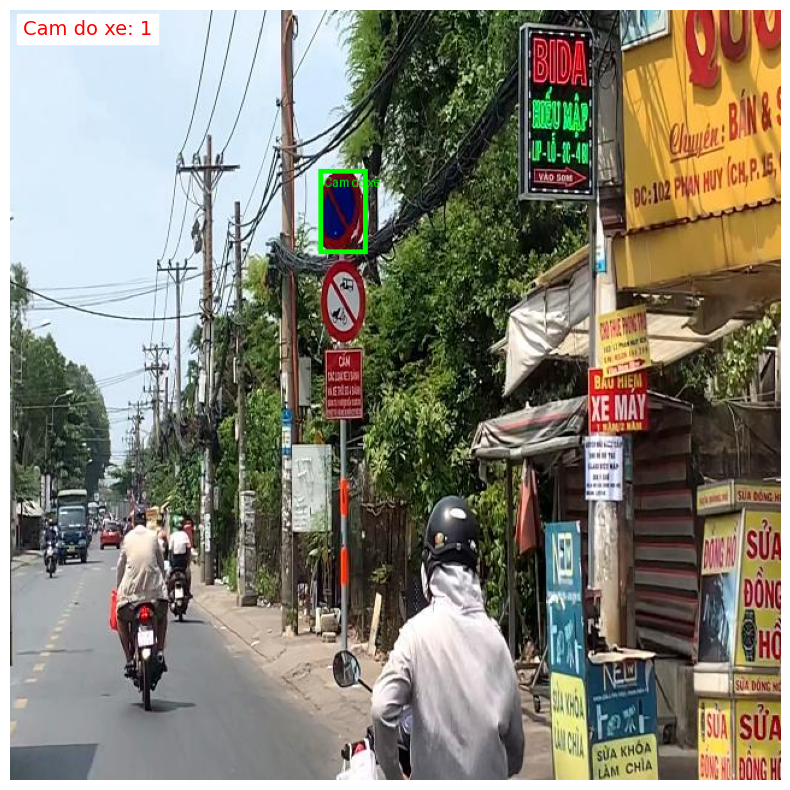


image 1/1 /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images/IMG_4028-MOV_out0006_png_jpg.rf.2c07537b7eee28ca514a1263b0db3222.jpg: 640x640 2 Toc do toi da cho pheps, 1 Cam dung xe va do xe, 8.6ms
Speed: 1.6ms preprocess, 8.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


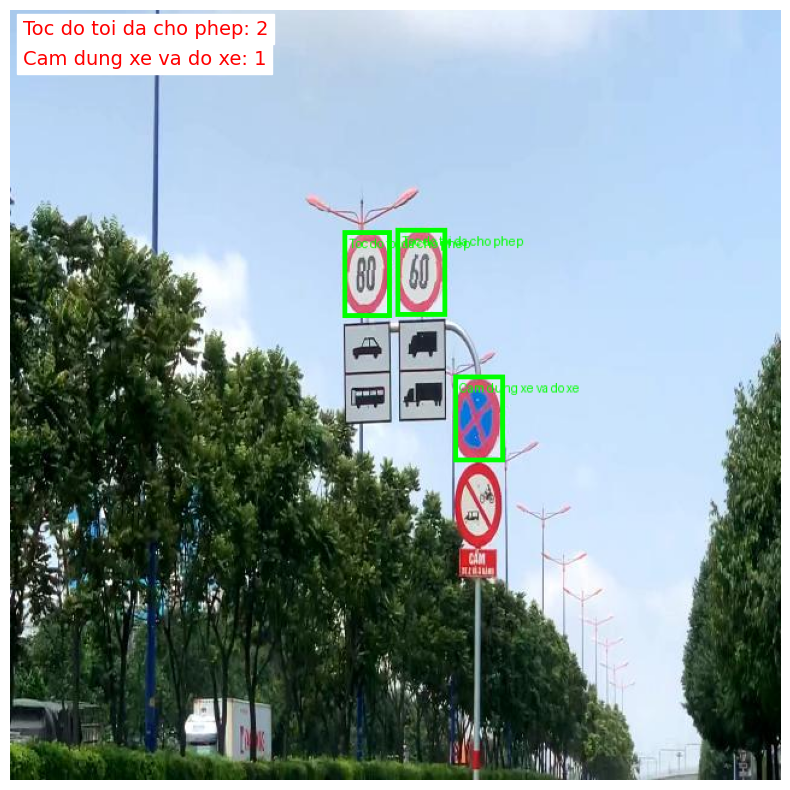


image 1/1 /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images/IMG_4119-MOV_out0004_png_jpg.rf.979fb54dcee51f5d668f80f8142ae118.jpg: 640x640 (no detections), 8.9ms
Speed: 1.7ms preprocess, 8.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


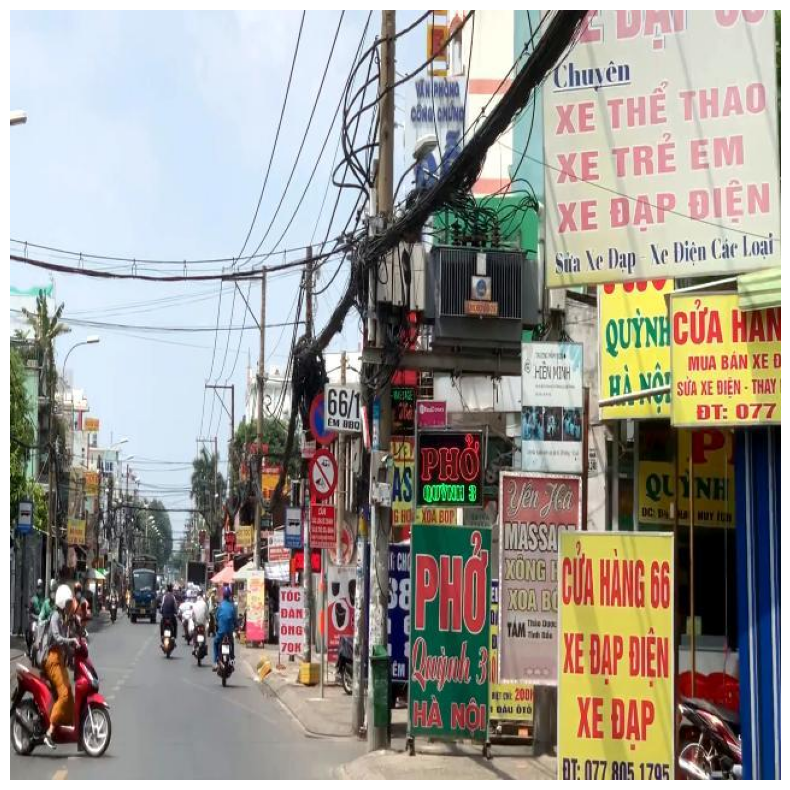


image 1/1 /kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images/IMG_4059-MOV_out0006_png_jpg.rf.45932c60c29c2cb55a2408ca47c85e1a.jpg: 640x640 1 Noi giao nhau chay theo vong xuyen, 8.4ms
Speed: 1.6ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


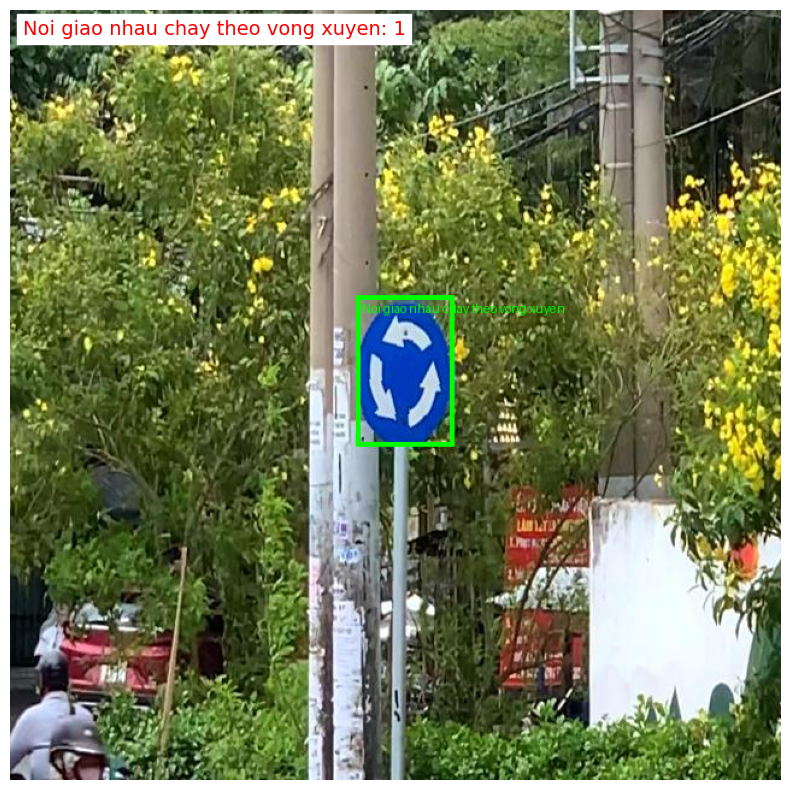

In [17]:
import os
import random
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from torchvision.utils import draw_bounding_boxes
from collections import Counter

# Load best model
model = YOLO("/kaggle/working/runs/detect/vietnam_traffic_sign/weights/best.pt")

# Classes (YOLO tự lưu trong model.names)
classes = model.names

# Thư mục test
test_dir = "/kaggle/input/datasets/bacnguyen2003/bien-bao-giao-thong-viet-nam/test/images"
image_files = [f for f in os.listdir(test_dir) 
               if f.endswith((".jpg", ".png", ".jpeg"))]

num_images_to_display = 10
sample_images = random.sample(image_files, num_images_to_display)

for img_name in sample_images:
    img_path = os.path.join(test_dir, img_name)

    # Đọc ảnh
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Predict
    results = model(img_path, conf=0.5)[0]

    boxes = results.boxes.xyxy.cpu()
    scores = results.boxes.conf.cpu()
    labels = results.boxes.cls.cpu().int()

    # Lấy tên class
    label_names = [classes[label.item()] for label in labels]

    # Đếm số lượng từng loại
    label_counts = Counter(label_names)

    # Convert image sang tensor uint8 để vẽ bbox
    img_tensor = torch.tensor(img_rgb).permute(2, 0, 1).to(torch.uint8)

    # Vẽ bounding boxes
    img_with_boxes = draw_bounding_boxes(
        img_tensor,
        boxes,
        label_names,
        colors="lime",
        width=4
    )

    # Chuyển sang numpy để hiển thị
    img_np = img_with_boxes.permute(1, 2, 0).numpy()

    # Hiển thị bằng matplotlib
    fig, ax = plt.subplots(figsize=(14, 10))
    ax.imshow(img_np)

    # Thêm text thống kê
    y_offset = 20
    for label, count in label_counts.items():
        ax.text(10, y_offset,
                f"{label}: {count}",
                fontsize=14,
                color="red",
                backgroundcolor="white")
        y_offset += 25

    # plt.title(f"Prediction: {img_name}")
    plt.axis("off")
    plt.show()

In [3]:
from ultralytics import YOLO

model = YOLO("/kaggle/working/runs/detect/vietnam_traffic_sign/weights/best.pt")

model.export(
    format="engine",   # 🔥 TensorRT
    imgsz=640,
    half=True,         # 🔥 FP16 (rất quan trọng cho T4)
    device=0
)

Ultralytics 8.4.41 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO11n summary (fused): 101 layers, 2,593,072 parameters, 0 gradients, 6.4 GFLOPs

PyTorch: starting from '/kaggle/working/runs/detect/vietnam_traffic_sign/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 60, 8400) (5.2 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 12 packages in 266ms
Prepared 2 packages in 2.88s
Installed 2 packages in 15ms
 + onnxruntime-gpu==1.25.0
 + onnxslim==0.1.91

requirements: AutoUpdate success ✅ 3.6s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.20.1 opset 18...
ONNX: slimming with onnxslim 0.1.91...
ONNX: exp

PosixPath('/kaggle/working/runs/detect/vietnam_traffic_sign/weights/best.engine')

In [4]:
import cv2
from ultralytics import YOLO
from collections import Counter

model = YOLO("/kaggle/working/runs/detect/vietnam_traffic_sign/weights/best.engine")
classes = model.names


def predict_frame(frame, conf=0.5):
    results = model(
        frame,
        conf=conf,
        imgsz=640,
        verbose=False
    )

    boxes = results[0].boxes

    label_names = []
    xyxy_list = []

    if boxes is not None:
        for box in boxes:
            if float(box.conf[0]) < conf:
                continue

            cls_id = int(box.cls[0])
            label = classes[cls_id]

            xyxy = box.xyxy[0].cpu().numpy().astype(int)

            label_names.append(label)
            xyxy_list.append(xyxy)

    return xyxy_list, label_names


def test_video():
    cap = cv2.VideoCapture("/kaggle/input/datasets/bacnguyen2003/video-test/7754682159964.mp4")

    fps    = int(cap.get(cv2.CAP_PROP_FPS))
    width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    out = cv2.VideoWriter(
        "output_trt.mp4",
        cv2.VideoWriter_fourcc(*"mp4v"),
        fps,
        (width, height)
    )

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        boxes, labels = predict_frame(frame)

        counts = Counter(labels)

        for box, label in zip(boxes, labels):
            x1, y1, x2, y2 = box
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, label, (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

        y_offset = 30
        for label, count in counts.items():
            cv2.putText(frame, f"{label}: {count}", (10, y_offset),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)
            y_offset += 30

        out.write(frame)

    cap.release()
    out.release()
    print("✅ Done TensorRT!")

Loading /kaggle/working/runs/detect/vietnam_traffic_sign/weights/best.engine for TensorRT inference...
[04/26/2026-13:18:13] [TRT] [I] Loaded engine size: 7 MiB
[04/26/2026-13:18:13] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in IExecutionContext creation: CPU +0, GPU +11, now: CPU 0, GPU 16 (MiB)


In [5]:
test_video()

Loading /kaggle/working/runs/detect/vietnam_traffic_sign/weights/best.engine for TensorRT inference...
[04/26/2026-13:18:20] [TRT] [I] Loaded engine size: 7 MiB
[04/26/2026-13:18:20] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in IExecutionContext creation: CPU +0, GPU +11, now: CPU 0, GPU 16 (MiB)
✅ Done TensorRT!
